In [50]:
from PIL import Image 
import PIL
import torch
import torch.nn as nn
import numpy as np
from torchvision import transforms
from torchvision.transforms.functional import to_pil_image
from torchvision.transforms import ToPILImage
import matplotlib.pyplot as plt
from torch.nn import functional as F

In [51]:
def show_image(image, cmap='gray'):
    fig, ax = plt.subplots(1,1)
    fig.set_size_inches(20,10)

    ax.imshow(image, cmap=cmap)
    ax.axis('off')
    plt.show()

def show_tensor(tensor: torch.Tensor):
    while len(tensor.shape) > 3:
        tensor = tensor.squeeze()
    
    while len(tensor.shape) < 3:
        tensor = tensor.unsqueeze(0)

    show_image(to_pil_image(tensor))

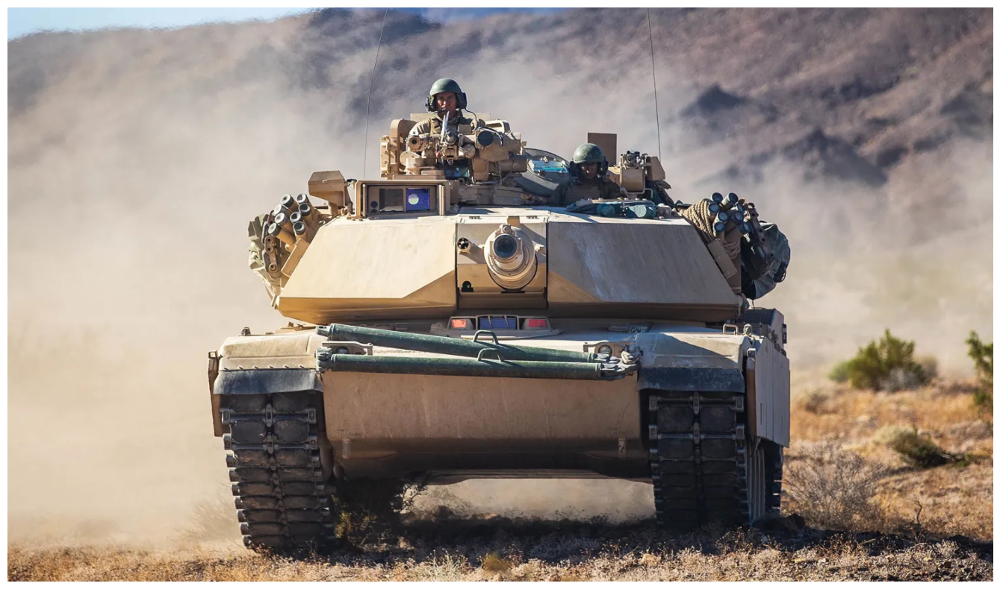

In [52]:
PATH = "./"
img = Image.open(PATH + "abrams-tank.png",)
show_image(img)

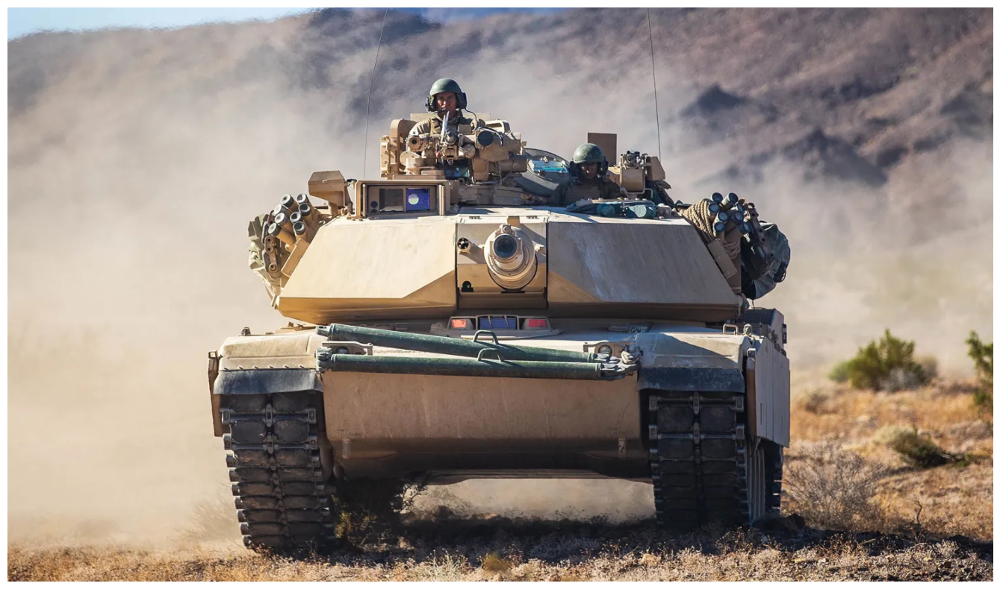

In [53]:
def convert_image_to_tensor(image: PIL.Image.Image) -> torch.Tensor:
    return transforms.ToTensor()(image)

image_tensor = convert_image_to_tensor(img)
show_tensor(image_tensor)

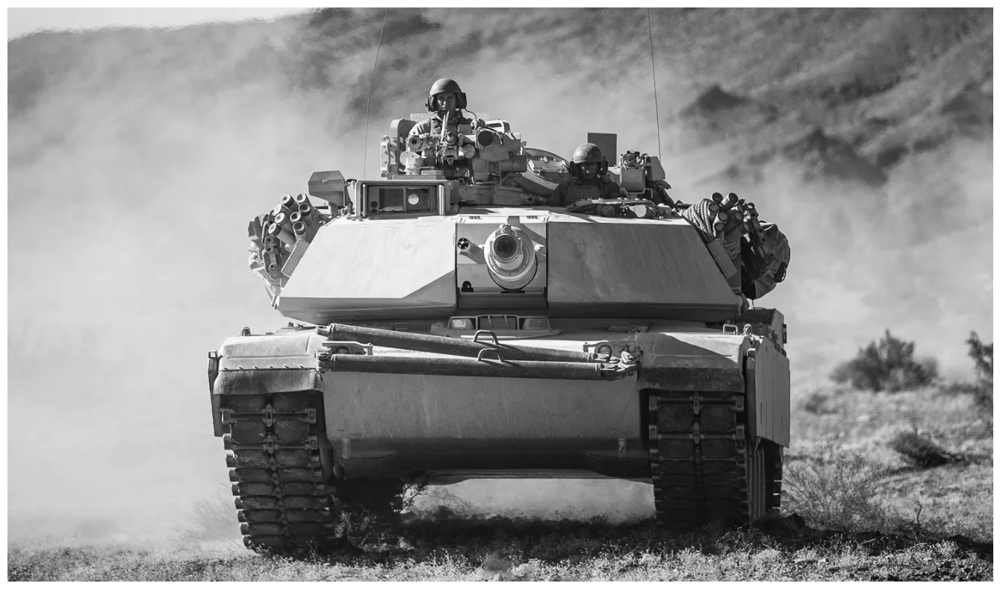

In [54]:
def apply_conv3d(input: torch.Tensor, weight: torch.Tensor, **kwargs) -> torch.Tensor: 
    return F.conv3d(input, 
        weight=weight,
        bias=None,
        stride=1, 
        padding=0
    )

# https://en.wikipedia.org/wiki/Rec._709#Luma_coefficients
def apply_grayscale(
    image: torch.Tensor, 
    weight: torch.Tensor = torch.tensor([[[[[0.2126]], [[0.7152]], [[0.0722]]]]]),
    **kwargs) -> torch.Tensor:

    image_with_grascale = apply_conv3d(image.unsqueeze(0), weight)
    return image_with_grascale

grayscale_image = apply_grayscale(image_tensor)
show_tensor(grayscale_image)

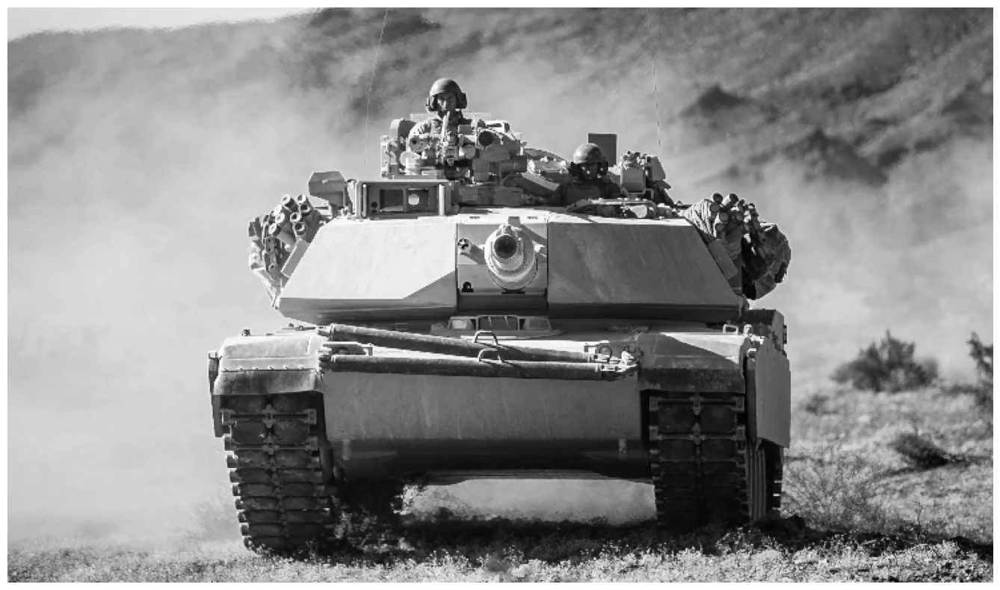

In [55]:
def apply_pool2d(input: torch.Tensor, kernel_size: tuple, **kargs) -> torch.Tensor:
    return F.max_pool2d(input, 
        kernel_size = kernel_size
    )

def scale_down_image(image: torch.Tensor, kernel_size: tuple=(4,4)):
    return apply_pool2d(grayscale_image, kernel_size = kernel_size)

scaled_down_image = scale_down_image(grayscale_image, (2,2))
show_tensor(scaled_down_image)

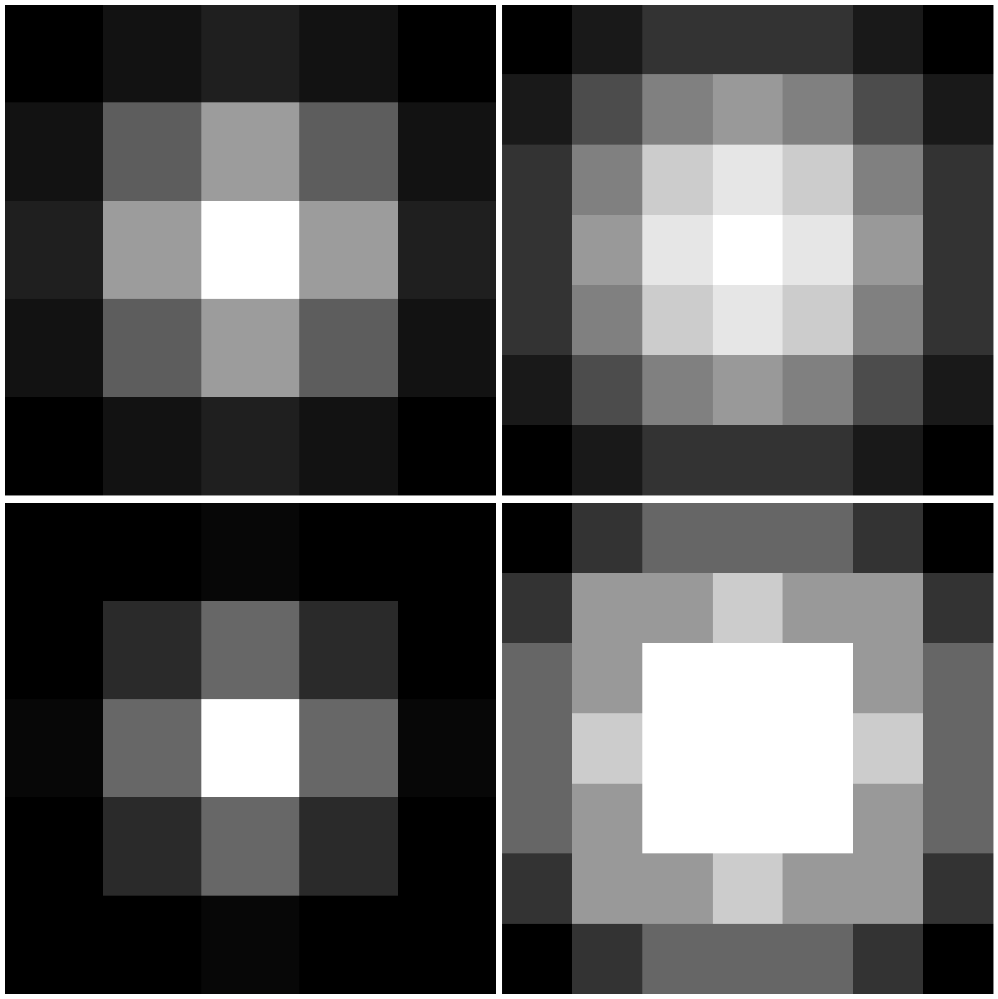

In [56]:
def gaussian_kernel(size: int = 5, sigma: int = 2) -> torch.Tensor:
    size = int(size) // 2
    x, y = np.mgrid[-size:size+1, -size:size+1]
    normal = 1 / (2.0 * np.pi * sigma**2)
    g = np.exp(-((x**2 + y**2) / (2.0*sigma**2))) * normal
    return torch.Tensor(g / g.sum())

def check_gaussian_kernel(weights: np.array) -> None: 
    assert torch.isclose(weights.sum(), torch.tensor(1.0)), f"Sum is not 1, it's {weights.sum()}"

filters = [
    gaussian_kernel(5,1), 
    gaussian_kernel(7,2), 
    gaussian_kernel(4,0.75), 
    gaussian_kernel(6,3), 
]

def show_grid(tensors: list, nrows: int = 2, ncols: int = 2):
    # Check if the length of tensors matches nrows * ncols
    assert len(tensors) == nrows * ncols, "Number of tensors must match the grid size."

    fig, axs = plt.subplots(nrows, ncols, figsize=(20, 20)) 
    for ax, tensor in zip(axs.flat, tensors):
        ax.imshow(ToPILImage()(tensor), cmap='gray') 
        ax.axis('off')

    plt.tight_layout()
    plt.show()

show_grid(filters) 

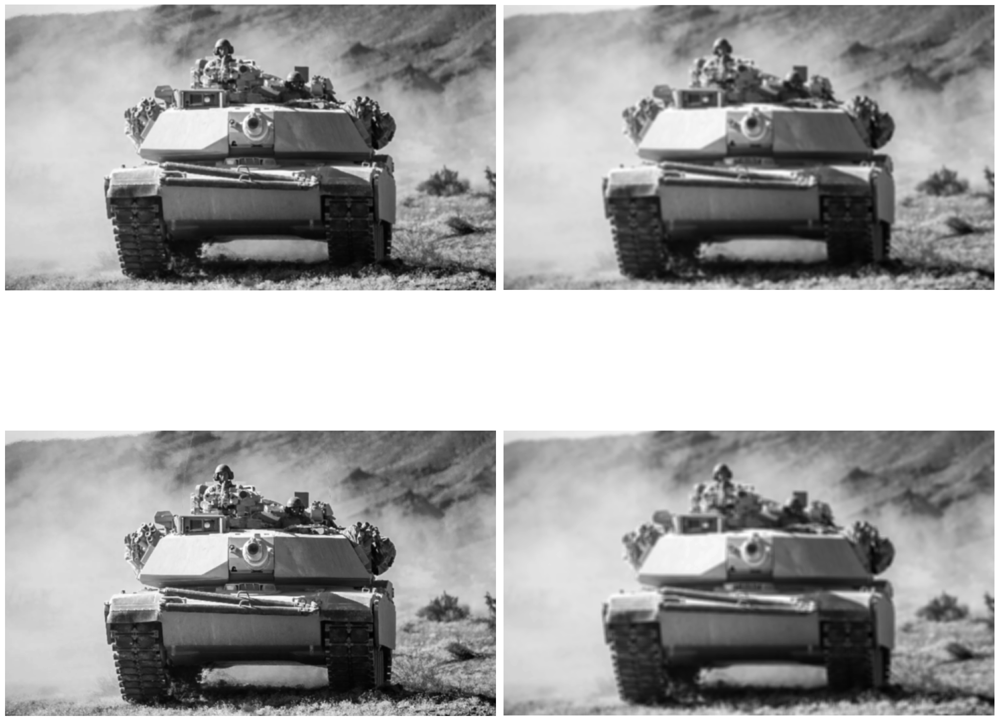

In [57]:
def apply_conv2d(input: torch.Tensor, weight: torch.Tensor, **kwargs) -> torch.Tensor: 
    assert len(input.shape) == len(weight.shape), f'Input and weights must have same dimensions {len(input.shape)} vs {len(weight.shape)}'
    
    return F.conv2d(input, 
        weight=weight,
        bias=torch.Tensor(weight.shape[0]),
        **kwargs
    )

def apply_gaussian_filter(
    input: torch.Tensor, 
    weight: torch.Tensor,
    **kwargs) -> torch.Tensor:

    image_with_gaussian_filter = apply_conv2d(input, weight)
    return image_with_gaussian_filter

images_with_gaussian_filter = [
    apply_gaussian_filter(scaled_down_image, filters[0].unsqueeze(0).unsqueeze(0)).squeeze(0),
    apply_gaussian_filter(scaled_down_image, filters[1].unsqueeze(0).unsqueeze(0)).squeeze(0),
    apply_gaussian_filter(scaled_down_image, filters[2].unsqueeze(0).unsqueeze(0)).squeeze(0),
    apply_gaussian_filter(scaled_down_image, filters[3].unsqueeze(0).unsqueeze(0)).squeeze(0)
]

show_grid(images_with_gaussian_filter)

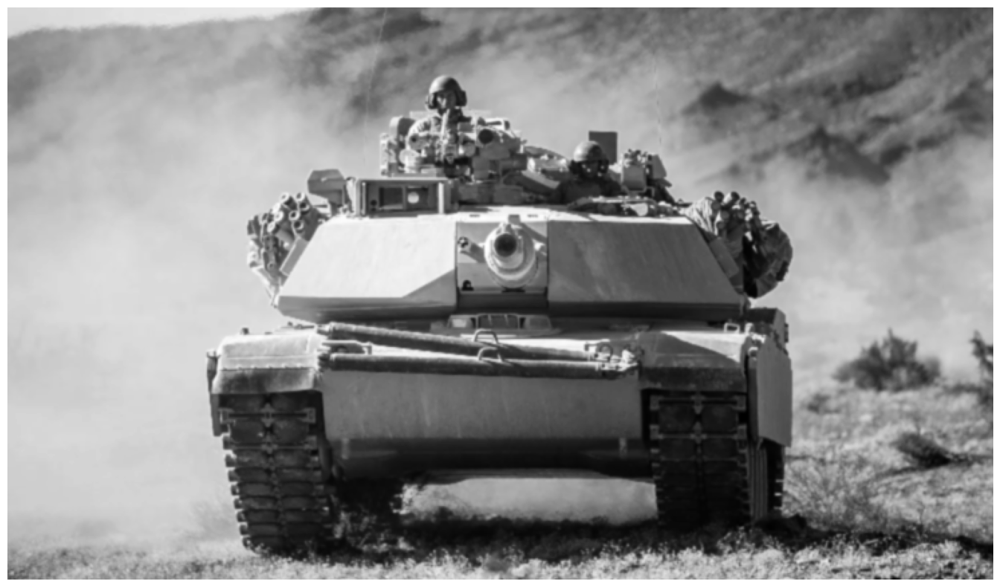

In [58]:
image_with_gaussian_filter = images_with_gaussian_filter[2].unsqueeze(0)
show_tensor(image_with_gaussian_filter)

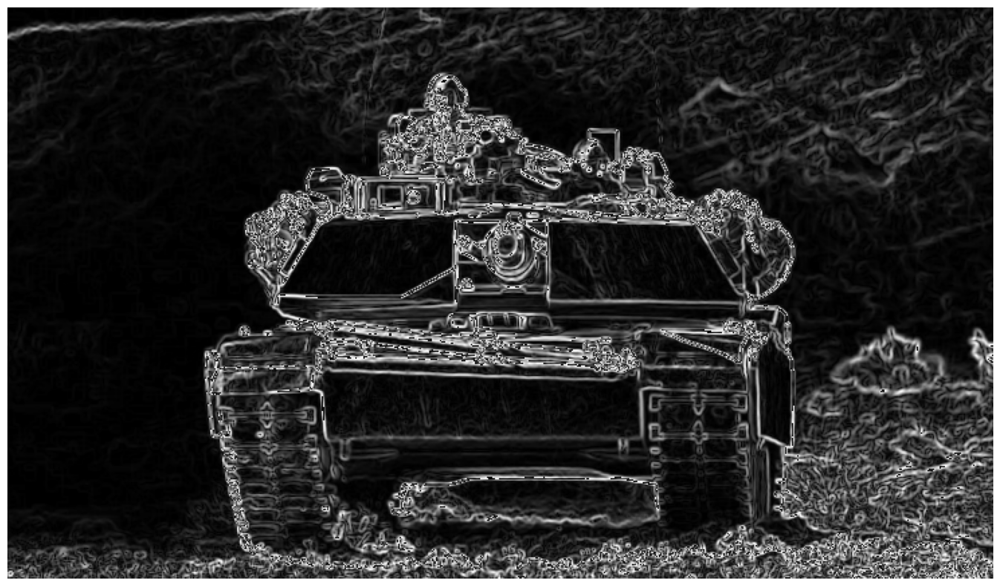

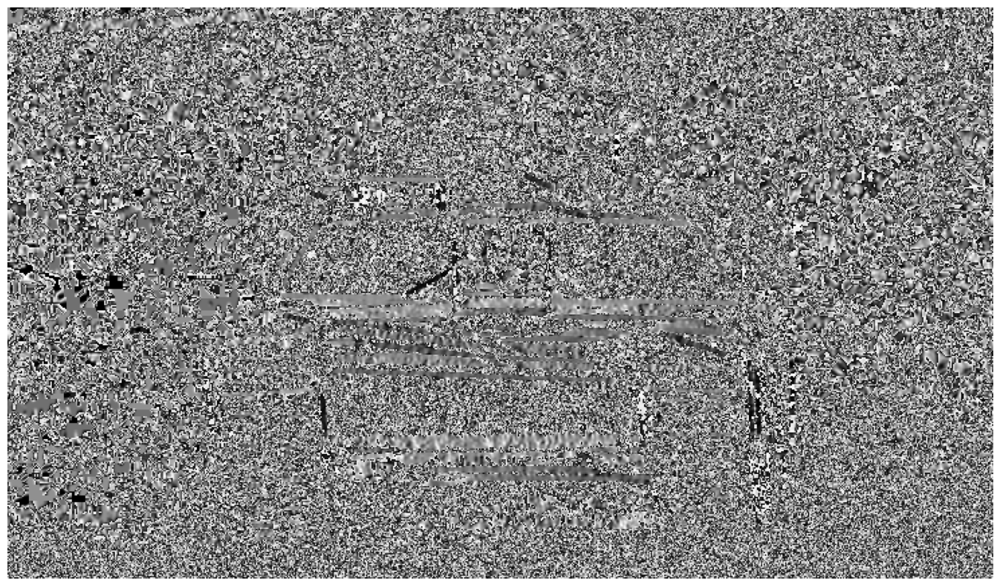

In [63]:
def sobel_filters(image: torch.Tensor):
    Kx = torch.tensor([[[-1, 0, 1], [-2, 0, 2],[-1,0,1]]], dtype=torch.float32)
    Ky = torch.tensor([[[1, 2, 1], [0, 0, 0],[-1, -2,-1]]], dtype=torch.float32)

    Ix = apply_conv2d(image, Kx.unsqueeze(0))
    Iy = apply_conv2d(image, Ky.unsqueeze(0))

    G = np.hypot(Ix, Iy)
    theta = np.arctan2(Iy, Ix)

    return (G, theta)

ampitude, direction = sobel_filters(image_with_gaussian_filter)
show_tensor(ampitude)
show_tensor(direction)

torch.Size([1, 1, 426, 734]) torch.Size([1, 1, 426, 734])


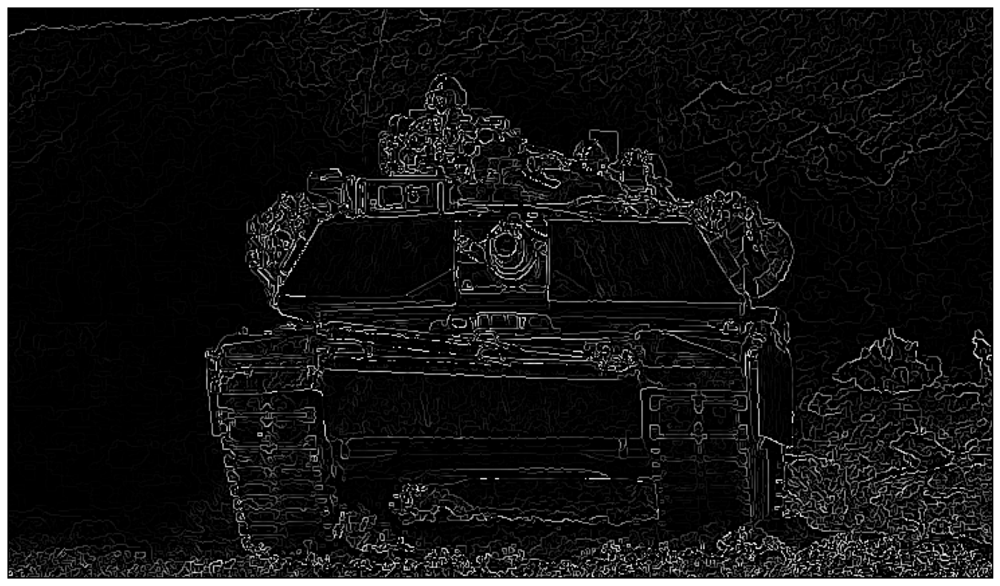

In [64]:
def non_max_supression(img, D):
    M, N = img.shape
    Z = torch.zeros((M, N), dtype=torch.float32)

    angle = D * 180 / np.pi 
    angle[angle < 0] += 180 

    for i in range(1,M-1):
        for j in range(1,N-1):
            try:
                q = 255
                r = 255
                #angle 0
                if (0 <= angle[i,j] < 22.5) or (157.5 <= angle[i,j] <= 180):
                    q = img[i, j+1]
                    r = img[i, j-1]
                #angle 45
                elif (22.5 <= angle[i,j] < 67.5):
                    q = img[i+1, j-1]
                    r = img[i-1, j+1]
                #angle 90
                elif (67.5 <= angle[i,j] < 112.5):
                    q = img[i+1, j]
                    r = img[i-1, j]
                #angle 135
                elif (112.5 <= angle[i,j] < 157.5):
                    q = img[i-1, j-1]
                    r = img[i+1, j+1]

                if (img[i,j] >= q) and (img[i,j] >= r):
                    Z[i,j] = img[i,j]
                else:
                    Z[i,j] = 0

            except IndexError as e:
                pass

    return Z

print(direction.shape, ampitude.shape)

non_max_result = non_max_supression(ampitude[0,0], direction.squeeze(0).squeeze(0))
show_tensor(non_max_result)

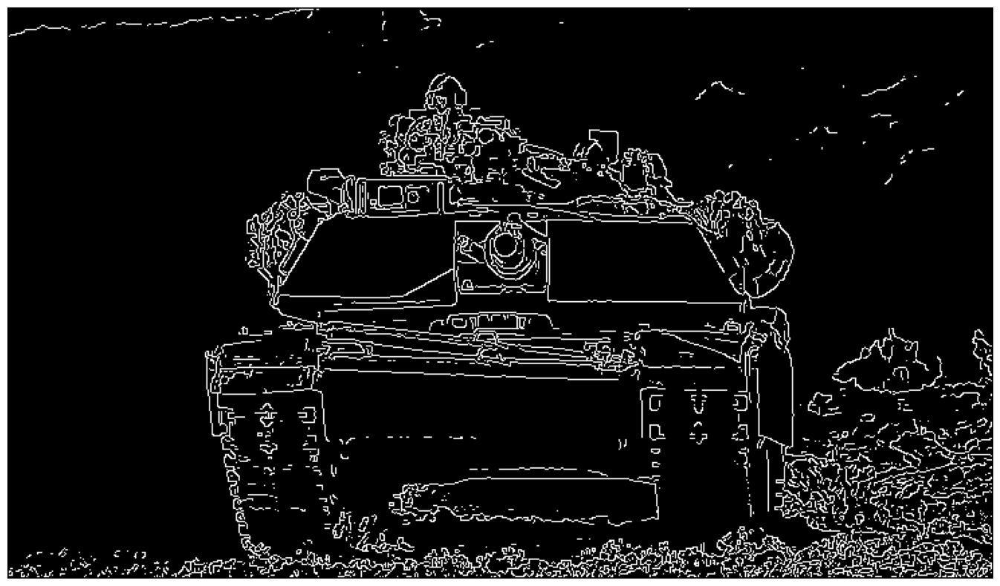

In [65]:
def thresholding(tensor, threshold_ratio=0.2):
    threshold = threshold_ratio * non_max_result.max()
    after_threshlod = F.threshold(non_max_result, threshold, 0)
    return torch.sign(after_threshlod)

thresholded = thresholding(non_max_result, 0.15)
show_image(thresholded)

torch.Size([3, 864, 1481]) torch.Size([3, 864, 1481])


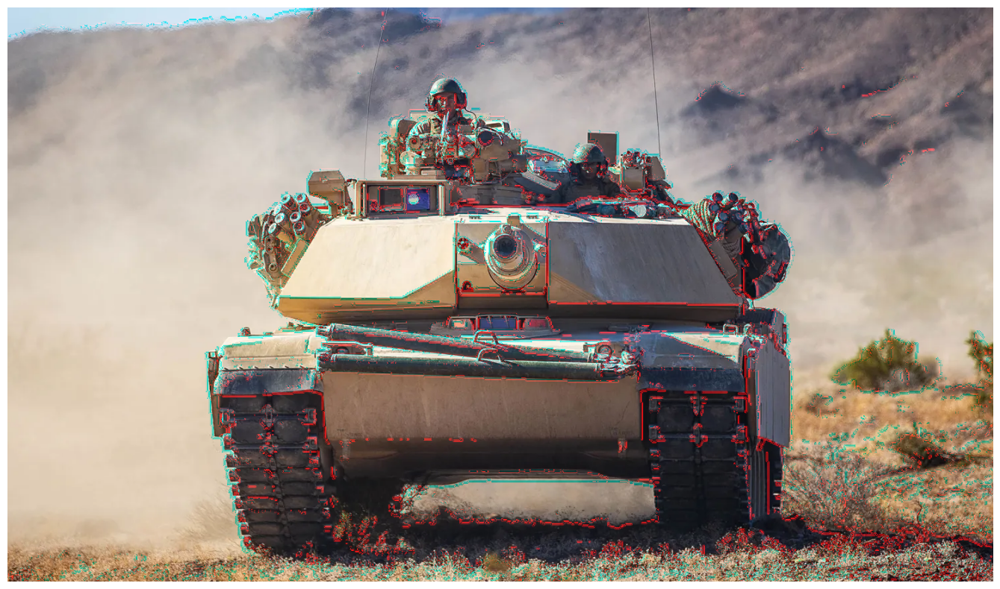

In [66]:
import torch
import numpy as np
from cv2 import resize

resized_output = torch.tensor(resize(np.array(thresholded), (image_tensor.shape[2], image_tensor.shape[1])), dtype=torch.float32)
colored_output = torch.zeros_like(image_tensor)  
colored_output[0] = resized_output * 10.0  

# Color manipulation
colored_output[1] = colored_output[1] * 10 
colored_output[0] = colored_output[0] * 0.2  
colored_output[2] = colored_output[2] * 0.2 

print(colored_output.shape, image_tensor.shape)

show_tensor(colored_output + image_tensor)